# Exploratory Data Analysis of Google's Playstore Apps Data Using Python



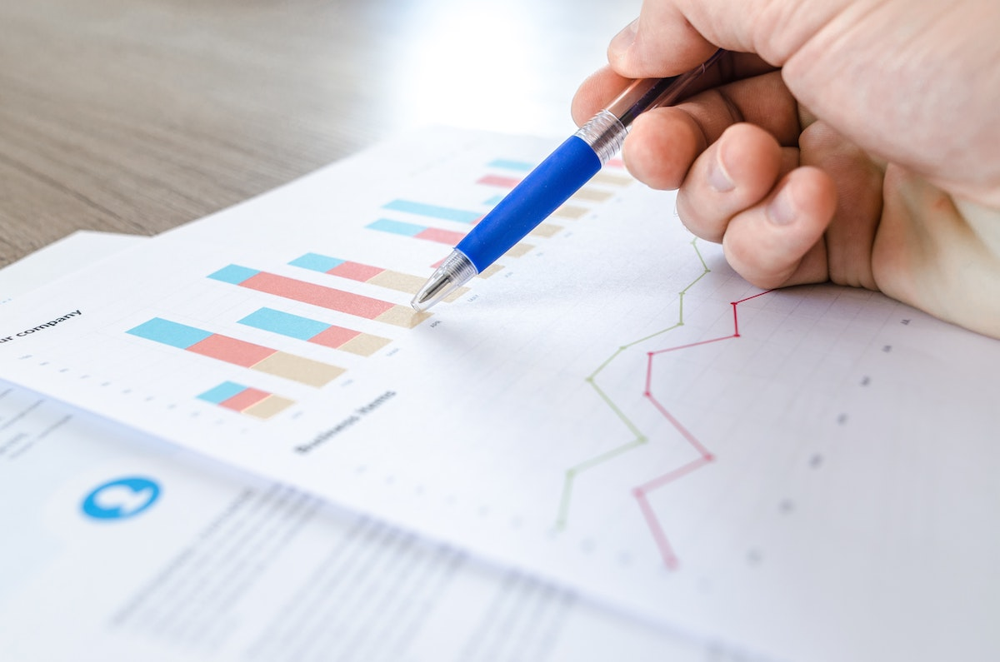

# 1 INTRODUCTION

### What is Data Analysis. 

Data analysis is the process of examining, cleaning, transforming, and modeling data with the goal of discovering useful information, suggesting conclusions, and supporting decision-making. It involves using statistical and computational techniques to uncover patterns, relationships, and trends within data.

### What is Data Visualization?
Data Visulization is a graphical representation of a given information and data. Visulization tools like charts Graphs and maps, it provides an excellent way for employees or business owners to present data to non-technical audiences without confusion by see and understand trends, outliers, and patterns in data.

### About Google/Android/Playstore
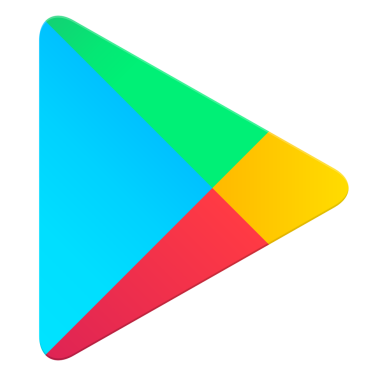


Google:

Google is a USA based Tech company.
It is referred as "The most powerful company in the world." It has multiple domain in different Search Engine, AI, Mobile OS, Advertising, Cloud and so much more.

Android:

Android is Open-Source Linux kernal modified based Mobile Operationg Syatem. It's main device is Smartphones but not limited to Smartphones.

Playstore:

Playstore is serves as the official app store for certified devices running on the Android operating system. It released on Oct/22/2008.

* 6.8 Billion smartphones are in the world.
* Playstore have 2.7M apps
* 70% Downloads of total Mobile Apps by Playstore.  


###   what this the Purpose of the project?

Purpose of the project is to extract meaningful insights and information from data through visual representations. By visualizing data, patterns, relationships, and trends become easier to see and understand. This can lead to more informed decision-making, improved communication, and increased understanding of the data.

In this project will analysis and visualize data of different apps that has been downloaded from google Play Store. Exploring and discovering new insights and relationships within data. Identifying areas for improvement or optimization.
By the Analysis and Visualization developer and business Community might get batter insite of the Consumer’s mindset and able to create more useful and profitable apps. 

### Outline
Steps for Data Visulization and Analysis

1. DATA COLLECTION
  * Download dataset fron Internet  using 'opendata'

2. EXPLORATORY ANALYSIS
  * Read Dataset with Pandas
  * Create Dataframe
  * Clean raw data with Pandas

3. ASK & ANSWERS
  * Matplotlib
  * Seaborn
  * Plotly.express

### Sample output 

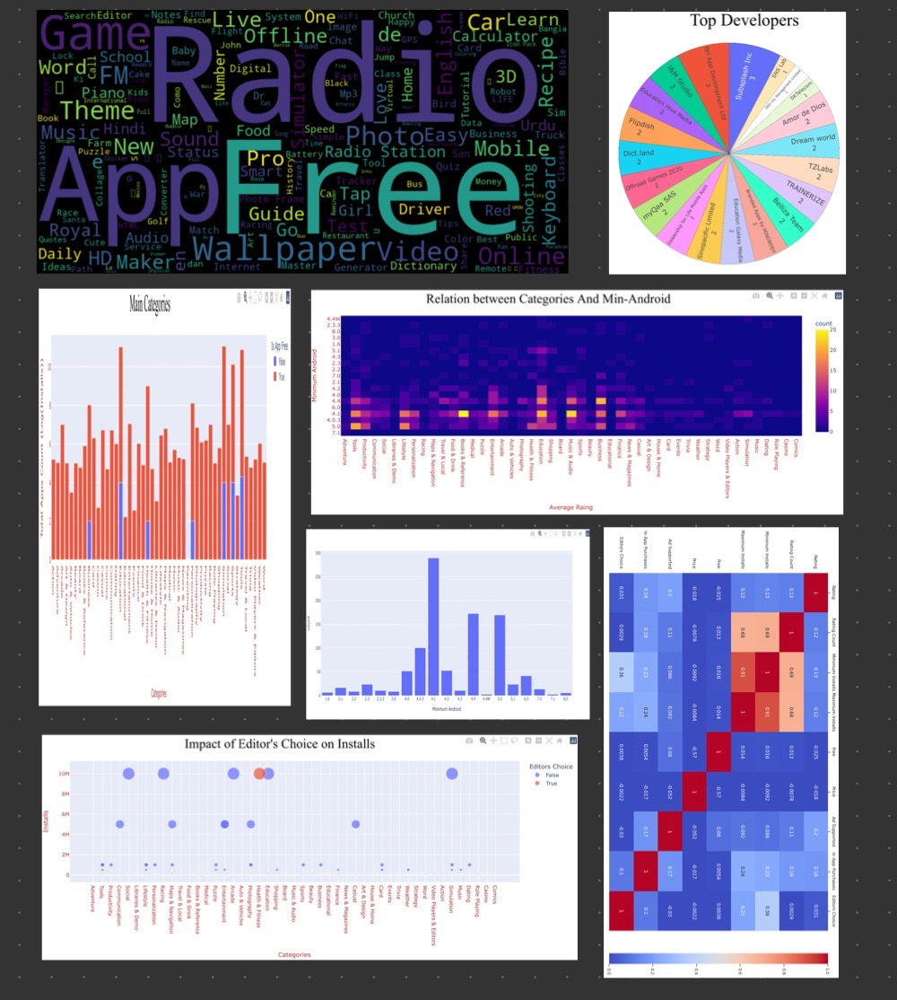

# 2 DATA COLLECTION  & CLEANING
(IMPORTING FILES)

## Importing Necessary Libraries

In [1]:
# Download dataset from Internet
! pip install opendatasets --quiet
import opendatasets as od

# Library for Data analysis
import pandas as pd

# Library for Numerical Computation
import numpy as np

# Libraryfor create wordcloud in python
from wordcloud import WordCloud

# LIbrary for Static visualization
import matplotlib
import matplotlib.pyplot as plt

# High level Statisical graphics 
import seaborn as sns

# Create Intractive charts
import plotly.express as px

## Downloading Dataset

In this project I have selected Playstore's App dataset from [Kaggle DATASET](https://www.kaggle.com/datasets/gauthamp10/google-playstore-apps). The dataset is created by Mr. GAUTHAM PRAKASH. 

This dataset contain 2.3 Millions row of data in 24 columns divided. Dataset have data till June/2021.

opendatasets is use to download dataset from internet. We have already installed a Library as od.

We'll download the dataset using od.download. While downloading the dataset from kaggle it will ask for kaggle username and key and these will be found in your kaggle account API section.

In [2]:

# Download Dataset from Internet
dataset_url = 'https://www.kaggle.com/datasets/gauthamp10/google-playstore-apps'
od.download(dataset_url)

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: shashwatpatel107
Your Kaggle Key: ··········


100%|██████████| 207M/207M [00:01<00:00, 109MB/s] 


In [3]:
df_url = "/content/google-playstore-apps/Google-Playstore.csv"

You can also go through the downloaded files using the "File" option left side in Colab. It seems like the dataset contains only one csv file:

'weather_data.csv': The weather information is in csv format.
Let's load the CSV file using the Pandas library. We'll use the name weather_raw_df for the dataframe to indicate the data is unprocessed that we might clean, filter, and modify to prepare a dataframe ready for analysis.

In [4]:
# Creating Dataframe
full_df = pd.read_csv(df_url)


Feather is a fast, lightweight, and easy-to-use binary file format for storing data frames. It has a few specific design goals: Lightweight, minimal API: make pushing data frames in and out of memory as simple as possible. Language agnostic: Feather files are the same whether written by Python

In [5]:
# Convert CSV to feather for faster access
full_df.to_feather("full_df.feather")
full_df_feather = pd.read_feather("full_df.feather")
full_df = full_df_feather

## Preparing DataFrame

full_df have 2.3M rows and 24 columns. We might not need all of the data to analysis.

The quality of data is the most crucial element of any business intelligence strategy. Data cleaning is the process of fixing or removing incorrect, corrupted, incorrectly formatted, duplicate, or incomplete data within a dataset.

In [6]:
# Viewing Dataset Columns
print(full_df.shape)
print(full_df.columns)

(2312944, 24)
Index(['App Name', 'App Id', 'Category', 'Rating', 'Rating Count', 'Installs',
       'Minimum Installs', 'Maximum Installs', 'Free', 'Price', 'Currency',
       'Size', 'Minimum Android', 'Developer Id', 'Developer Website',
       'Developer Email', 'Released', 'Last Updated', 'Content Rating',
       'Privacy Policy', 'Ad Supported', 'In App Purchases', 'Editors Choice',
       'Scraped Time'],
      dtype='object')


Creating a list of all the columns that need to use in the analysis. unnecessary columns will slow the loading and create lots of unwanted space.

In [7]:
# Creating List of Required Columns
lists = ["App Name", "Category", "Rating","Rating Count",
         'Installs', 'Free', 'Price', 'Size', 'Minimum Android',
         'Developer Id', 'Released',  'Editors Choice']

Create a New dataframe with given columns only.

In [8]:
# Create New Dataframe With Only Necessary Columns         
df = full_df[lists].copy()
# df = pd.read_csv(df_url, usecols= lists ) # Create directly from dataset

In [9]:
# Convert CSV to feather for faster access
df.to_feather("df.feather")
df_feather = pd.read_feather("df.feather")
df = df_feather

just creat a dataframe with 30000 rows to save computing.
Comment for full dataset

In [10]:
# Comment this line out for full dataset
df = df_feather.head(30000)

Let's see how new data frame looks like

In [11]:
# Size of a Dataset
print(df.shape)

(30000, 12)


In [12]:
# Basic Information About Dataset
print(df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   App Name         30000 non-null  object 
 1   Category         30000 non-null  object 
 2   Rating           29729 non-null  float64
 3   Rating Count     29729 non-null  float64
 4   Installs         29999 non-null  object 
 5   Free             30000 non-null  bool   
 6   Price            30000 non-null  float64
 7   Size             30000 non-null  object 
 8   Minimum Android  29913 non-null  object 
 9   Developer Id     30000 non-null  object 
 10  Released         29148 non-null  object 
 11  Editors Choice   30000 non-null  bool   
dtypes: bool(2), float64(3), object(7)
memory usage: 2.3+ MB
None


In [13]:
# Statistical Values of Numerical Columns
print(df.describe)

<bound method NDFrame.describe of                                                 App Name       Category  \
0                                                Gakondo      Adventure   
1                                    Ampere Battery Info          Tools   
2                                                 Vibook   Productivity   
3      Smart City Trichy Public Service Vehicles 17UC...  Communication   
4                                                GROW.me          Tools   
...                                                  ...            ...   
29995                                岡崎市にある「T.C.S」の公式アプリ      Lifestyle   
29996                                       Switch Color         Puzzle   
29997          Neon Effects Photo Editor – Photo filters    Photography   
29998                                    Somente Pela Fé  Music & Audio   
29999               Casual Pool 8 - American 8 Ball Pool         Casual   

       Rating  Rating Count Installs  Free  Price  Size Minimum A

In [14]:
df.isna().sum()

App Name             0
Category             0
Rating             271
Rating Count       271
Installs             1
Free                 0
Price                0
Size                 0
Minimum Android     87
Developer Id         0
Released           852
Editors Choice       0
dtype: int64

## Data Cleaning

In [15]:
# Total Missing Values By column 

"""
App Name               2
Category               0
Rating             22883
Rating Count       22883
Installs             107
Free                   0
Price                  0
Size                 196
Minimum Android     6530
Developer Id          33
Released           71053
Editors Choice         0
"""

'\nApp Name               2\nCategory               0\nRating             22883\nRating Count       22883\nInstalls             107\nFree                   0\nPrice                  0\nSize                 196\nMinimum Android     6530\nDeveloper Id          33\nReleased           71053\nEditors Choice         0\n'

App Name
remove entire rows where 'App Name' is missing

In [16]:
print(df['App Name'].unique)

<bound method Series.unique of 0                                                  Gakondo
1                                      Ampere Battery Info
2                                                   Vibook
3        Smart City Trichy Public Service Vehicles 17UC...
4                                                  GROW.me
                               ...                        
29995                                  岡崎市にある「T.C.S」の公式アプリ
29996                                         Switch Color
29997            Neon Effects Photo Editor – Photo filters
29998                                      Somente Pela Fé
29999                 Casual Pool 8 - American 8 Ball Pool
Name: App Name, Length: 30000, dtype: object>


In [17]:
# Remove Rows where App Name is missing
df.dropna(subset= ["App Name"], axis = 0, how = "any", inplace = True)

/usr/local/lib/python3.8/dist-packages/pandas/util/_decorators.py:311: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return func(*args, **kwargs)


Rating Count
Find the missing values and fill them with the overall average of the column.

In [18]:
# Fill Average values for missing values in Rating column,
df["Rating Count"].fillna(value = (df["Rating Count"].mean()), inplace = True)

/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6392: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)


In [19]:
print(df['Rating Count'].unique)

<bound method Series.unique of 0         0.0
1        64.0
2         0.0
3         5.0
4         0.0
         ... 
29995     0.0
29996    34.0
29997     0.0
29998    84.0
29999    30.0
Name: Rating Count, Length: 30000, dtype: float64>


In [20]:
df['Rating Count'] = df['Rating Count'].astype(int)  

<ipython-input-20-b111ef0b4833>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Rating Count'] = df['Rating Count'].astype(int)


In [21]:
print(df['Rating Count'].value_counts())

0        13699
5          856
6          719
7          633
8          515
         ...  
2202         1
9216         1
4521         1
5692         1
13778        1
Name: Rating Count, Length: 2433, dtype: int64


Installs
For Installs we use forward fill method to address missing values.

ffill methond finds a missing values and copy values of above cell.

In [22]:
# Installs
df["Installs"].fillna(method = "ffill", inplace =True)

In [23]:
print(df['Installs'].unique)

<bound method Series.unique of 0           10+
1        5,000+
2           50+
3           10+
4          100+
          ...  
29995       10+
29996    1,000+
29997        5+
29998    1,000+
29999    1,000+
Name: Installs, Length: 30000, dtype: object>


In [24]:
# Remove "+" from Installs and conver to Integer
df['Installs'] = df['Installs'].apply(lambda x: str(x).replace('+', '') if '+' in str(x) else x)
df['Installs'].replace(',','', regex=True, inplace=True) #replace the commas ',' in the install column
df['Installs'] = df['Installs'].astype(int)              # converting it to the int type

<ipython-input-24-e83cef834214>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Installs'] = df['Installs'].apply(lambda x: str(x).replace('+', '') if '+' in str(x) else x)
/usr/local/lib/python3.8/dist-packages/pandas/core/generic.py:6619: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return self._update_inplace(result)
<ipython-input-24-e83cef834214>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pyda

In [25]:
df['Installs'].dtype

dtype('int64')

Size

Convert differt formet data into single unit and conver it to int

In [26]:
# Size
df["Size"].fillna(method = "ffill", inplace = True)

In [27]:
print(df['Size'].value_counts())

Varies with device    935
11M                   808
12M                   679
14M                   625
13M                   615
                     ... 
717k                    1
170k                    1
901k                    1
505k                    1
937k                    1
Name: Size, Length: 641, dtype: int64


In [28]:
# convert to Integer

df['Size'] = df['Size'].apply(lambda x: str(x).replace('Varies with device', "24M") if 'Varies with device' in str(x) else x);
df['Size'] = df['Size'].apply(lambda x: str(x).replace('M',"") if 'M' in str(x) else x);
df['Size'] = df['Size'].apply(lambda x: str(x).replace(',', "")  if ',' in str(x) else x);
df['Size'] = df['Size'].apply(lambda x: float((str(x).replace('G', '0')))*1000 if 'G' in str(x) else x);
df['Size'] = df['Size'].apply(lambda x: float((str(x).replace('k', '0')))/10000 if 'k' in str(x) else x);

df['Size'] = df['Size'].apply(lambda x: float(x));

<ipython-input-28-ce307ebeeaef>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Size'] = df['Size'].apply(lambda x: str(x).replace('Varies with device', "24M") if 'Varies with device' in str(x) else x);
<ipython-input-28-ce307ebeeaef>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Size'] = df['Size'].apply(lambda x: str(x).replace('M',"") if 'M' in str(x) else x);
<ipython-input-28-ce307ebeeaef>:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try usi

In [29]:
print(df['Size'].dtype)

float64


Rating

Combine rating and make a int column

In [30]:
# Rating
df["Rating"].fillna(value = 4, inplace = True)

In [31]:
df["Rating"].unique()

array([0. , 4.4, 5. , 4.5, 2. , 4.7, 4.9, 3.9, 3.7, 4.2, 3.4, 3.8, 4.6,
       4.1, 2.5, 2.3, 2.1, 2.7, 4.3, 3.1, 4.8, 3.3, 4. , 2.4, 3.2, 3.6,
       2.6, 1.5, 3.5, 2.9, 1.3, 2.8, 3. , 2.2, 1.8, 1.4, 1.2, 1.9, 1.7,
       1.6, 1. , 1.1])

In [32]:
df["Rating"] = df['Rating'].apply(np.ceil)
df['Rating'] = df['Rating'].apply(lambda x: int(x));

<ipython-input-32-9b02716c2997>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["Rating"] = df['Rating'].apply(np.ceil)
<ipython-input-32-9b02716c2997>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Rating'] = df['Rating'].apply(lambda x: int(x));


In [33]:
df["Rating"].value_counts()

0    13699
5     9833
4     5138
3     1126
2      193
1       11
Name: Rating, dtype: int64

Minimum Android
remove string from behind. convert 'Varies with device' with most common 4.1

In [34]:
df["Minimum Android"].unique()

array(['7.1 and up', '5.0 and up', '4.0.3 and up', '4.1 and up',
       '6.0 and up', '4.4 and up', '4.0 and up', '4.2 and up',
       '2.1 and up', '7.0 and up', '2.2 and up', '2.3 and up',
       '4.3 and up', '5.1 and up', None, '1.6 and up', '3.0 and up',
       'Varies with device', '8.0 and up', '2.3.3 and up', '4.4W and up',
       '3.2 and up', '1.5 and up', '4.0.3 - 7.1.1', '3.1 and up',
       '2.0 and up', '1.0 and up', '1.1 and up', '2.0.1 and up',
       '4.4 - 6.0', '2.1 - 4.4', '4.0 - 5.0', '2.0 - 2.3.4'], dtype=object)

In [35]:
# Fill minimum values for missing values in Mininum Android
df["Minimum Android"].fillna(value = "4.1 and up", inplace = True)

In [36]:
df['Minimum Android'] = df['Minimum Android'].apply(lambda x: str(x).replace('Varies with device', '4.1 and up') if 'Varies with device' in str(x) else x)
df['Minimum Android'] = df['Minimum Android'].apply(lambda x: str(x).replace(' and up', '') if ' and up' in str(x) else x)
df['Minimum Android'] = df['Minimum Android'].apply(lambda x: str(x).replace('W', '') if 'W' in str(x) else x)

<ipython-input-36-cea93fde3a33>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Minimum Android'] = df['Minimum Android'].apply(lambda x: str(x).replace('Varies with device', '4.1 and up') if 'Varies with device' in str(x) else x)
<ipython-input-36-cea93fde3a33>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Minimum Android'] = df['Minimum Android'].apply(lambda x: str(x).replace(' and up', '') if ' and up' in str(x) else x)
<ipython-input-36-cea93fde3a33>:3: SettingWithCopyWarning: 
A value is t

In [37]:
df["Minimum Android"].value_counts()

4.1              8555
4.4              5299
5.0              5128
4.0.3            2380
4.0              1941
4.2              1552
6.0              1136
2.3               835
5.1               727
4.3               538
7.0               433
2.2               296
2.3.3             283
3.0               227
2.1               217
8.0               168
1.6                96
7.1                43
1.5                33
2.0                33
3.2                31
3.1                29
2.0.1               8
1.0                 4
1.1                 3
4.0.3 - 7.1.1       1
4.4 - 6.0           1
2.1 - 4.4           1
4.0 - 5.0           1
2.0 - 2.3.4         1
Name: Minimum Android, dtype: int64

Develpoer Id
Replace missing values with 'Others' string.

In [38]:
# Fill "Others" in Developer Id missing values
df["Developer Id"].fillna(value = "Others", inplace = True)

Released
Convert Object type to DateTime

In [39]:
# Fill above date in missing values for Released Column
df["Released"].fillna(method = "ffill" ,inplace = True)

In [40]:
df['Released']= pd.to_datetime(df['Released'])

<ipython-input-40-bacc4aac5498>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Released']= pd.to_datetime(df['Released'])


In [41]:
df["Released"].dtype

dtype('<M8[ns]')

# 3 EXPLORATORY ANALYSIS

# WordCloud
Extract words from App Name and Create a string variable.

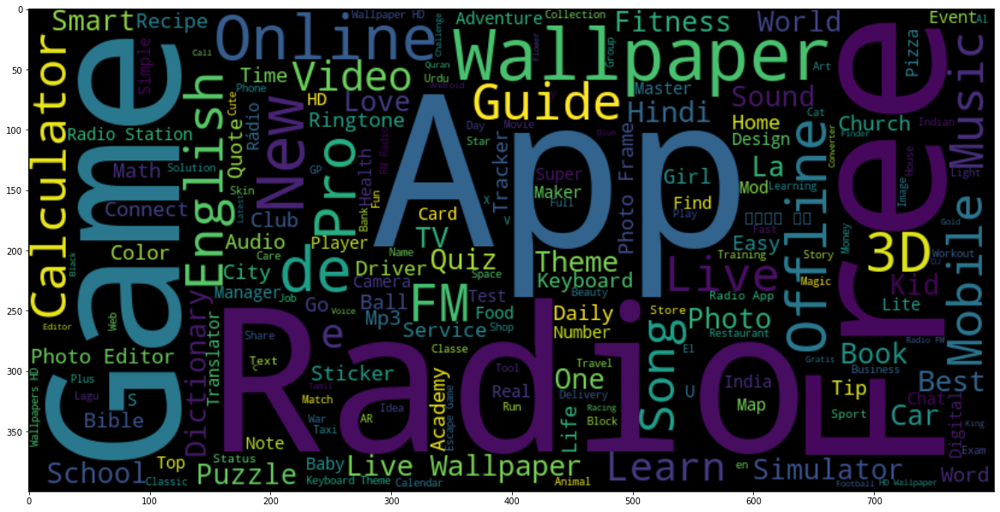

In [42]:
# 1 generat a list of words in 'App Name for Word cloud
name = df["App Name"]
words = ' '.join((job for job in name.dropna().str.replace(';', ' ').str.replace(',', ' ')))

wc = WordCloud( width=800, height=400, background_color='black', ).generate(words)

plt.figure(figsize=(16,9))
plt.imshow(wc, interpolation='bilinear');
plt.axis =("off")
plt.tight_layout(pad=0)
plt.grid(False)

plt.show()

'Free', 'App', 'Game', 'Radio', 'Wallpaper' are the most common words in the App Name.

## Top Developer
Create a new dataframe to count number of Apps developed by ecah developer.

In [43]:
# 2 Top Developer 
dev_df = df.groupby(by = df["Developer Id"])['App Name'].count().reset_index().sort_values(by='App Name',ascending=False)
dev_df.columns= ['Developer','App Count']


In [44]:
fig = px.scatter(dev_df, 
             x = "App Count",
             y = "Developer",
             size = "App Count")

fig.update_layout(title = "Developers",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="Brown",
                    title_font_size= 20,
                    xaxis_title = "No. of Apps",
                    yaxis_title = "Developer",
                    )

fig.update_xaxes(color='black')
fig.update_yaxes(color='black')
  
fig.show()

Majority of the developer have only one app. Some outliner have multiple.

# Category with Most Apps
Create data frame with count number of Apps by each category and also divide into free& Paid.

also convert to log value for batter representation and faster access.

In [45]:
# 3 Category with most apps
categoty_installs = df.groupby(['Category','Free'])[['Installs']].sum().reset_index()
categoty_installs['count_Installs'] = np.log10(categoty_installs['Installs'])

/usr/local/lib/python3.8/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning:

divide by zero encountered in log10



In [46]:
categoty_installs

,Category,Free,Installs,count_Installs
0,Action,False,633551,5.801782
1,Action,True,202131451,8.305634
2,Adventure,False,1136210,6.055459
3,Adventure,True,151984663,8.181800
4,Arcade,False,128016,5.107264
...,...,...,...,...
85,Video Players & Editors,True,131485036,8.118876
86,Weather,False,56001,4.748196
87,Weather,True,23287877,7.367130
88,Word,False,1001005,6.000436


In [47]:
fig = px.bar(categoty_installs, 
             x = "Category",
             y = "Installs",
            )

fig.update_layout(title = "Category",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="Brown",
                    title_font_size= 20,
                    )

fig.update_xaxes(color='black')
fig.update_yaxes(color='black')
  
fig.show()

People have more focus on Productivity. 

## Money vs Downloads

In [48]:
# 7 Money Talks
money_df = df.sort_values(by =["Installs"])

In [49]:
fig = px.bar(money_df, 
             x = "Free",
             y = "Installs",
            )

fig.update_layout(title = "Money",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="Brown",
                    title_font_size= 20,
                    )

fig.update_xaxes(color='black')
fig.update_yaxes(color='black')
  
fig.show()

People do like free stuff. 

## Editor's Choice
Create a new dataframe with 'Installs', 'Category' and 'Editors Choice' column.  Also sort values by number of installs.

In [50]:
# 8 Editor
editor_df =df[["Installs", "Category", "Editors Choice"]].copy()
editor_df  = editor_df.sort_values(by = "Installs")

In [51]:
fig = px.scatter(editor_df, 
             x = "Category",
            y = "Installs",
            color = "Editors Choice",
            )

fig.update_layout(title = "Editors Choice",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="Brown",
                    title_font_size= 20,
                    )

fig.update_xaxes(color='black')
fig.update_yaxes(color='black')
  
fig.show()

Editor's Choice has some Average performing Apps. 

## Size matters?

In [52]:
# 9 Size impact on downloads
df_size_down = df[["Size", "Installs", "Free"]].sort_values(by = "Size")

In [53]:
fig = px.line(df_size_down, 
             x = "Size",
            y = "Installs",
            color = "Free",
            )

fig.update_layout(title = "Size",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="Brown",
                    title_font_size= 20,
                    )

fig.update_xaxes(color='black')
fig.update_yaxes(color='black')
  
fig.show()

Big buildings are in the beginning. Lighter apps havae a batter chance to get higger install numbers.

## Baseline Android

In [54]:
# 11 Baseline Android
df_min_and = df["Minimum Android"].sort_values()

In [55]:
fig = px.histogram(df_min_and
            )

fig.update_layout(title = "Android",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="Brown",
                    title_font_size= 20,
                    yaxis_title = "No.of Apps",
                    xaxis_title = "Andr",
                    )

fig.update_xaxes(color='black')
fig.update_yaxes(color='black')
  
fig.show()

4.1 is the baseline android for more of the apps.

## Apps released Evey year

In [56]:
df["Released"]

0       2020-02-26
1       2020-05-21
2       2019-08-09
3       2018-09-10
4       2020-02-21
           ...    
29995   2015-05-28
29996   2014-08-31
29997   2021-03-29
29998   2016-04-11
29999   2019-07-23
Name: Released, Length: 30000, dtype: datetime64[ns]

In [57]:
# No. Apps released every year.
df["Year"] = df["Released"].apply(lambda x: str(x).split('-')[0] if ' ' in str(x) else x);
df["Year"] = df["Year"].sort_values(ascending = False);

<ipython-input-57-9bbff3968a0c>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-57-9bbff3968a0c>:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [58]:
fig = px.histogram(df["Year"]
            )

fig.update_layout(title = "Year",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="Brown",
                    title_font_size= 20,
                    yaxis_title = "No.of Apps",
                    xaxis_title = "Year",
                    )

fig.update_xaxes(color='black')
fig.update_yaxes(color='black')
  
fig.show()

Graph is increasing year by year.

In [59]:
# print(df["Year"].value_counts())
print(df["Year"])

0        2020
1        2020
2        2019
3        2018
4        2020
         ... 
29995    2015
29996    2014
29997    2021
29998    2016
29999    2019
Name: Year, Length: 30000, dtype: object


# 4 ASK & ANSWERS 

So far we have many insights about the data. Now we havae 12 Columns: 

['App Name', 'Category', 'Rating', 'Rating Count', 'Installs', 'Free', 'Price', 'Size', 'Minimum Android','Developer Id', 'Released', 'Editors Choice']

We should asked more specific questions and try to Answer them with proper data visulization.

Questions that needs to be asked

1. Who are the top developers?
2. Which category have highest apps?
3. Which category have highest rating apps?  
4. Which are the top App category by downloads?
5. Does Rating Matters in downloads?
6. Does Money affect Downloads?
7. Does Editor's Choice have any impact on Downloads?
8. Does Size of the app matters?
9. How many apps released every year?
10. What is the Base line Android version?

## 1 Which word appear most in App Name?

In [60]:
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (16, 9)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

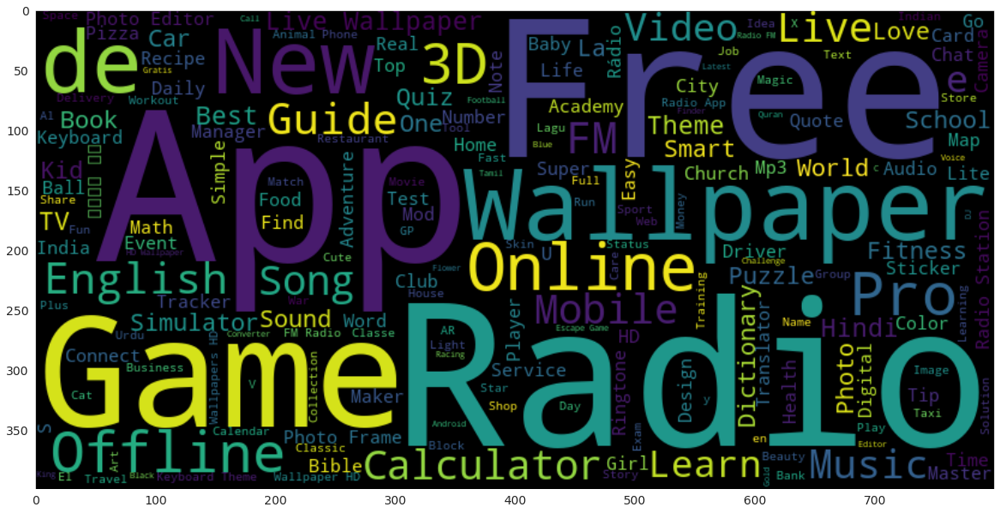

In [61]:
# Create a single string with words in App Name
name = df["App Name"]
words = ' '.join((job for job in name.dropna().str.replace(';', ' ').str.replace(',', ' ')))

wc = WordCloud( width=800, height=400, background_color='black', ).generate(words)

plt.figure(figsize=(16,9))
plt.imshow(wc, interpolation='bilinear');
plt.axis =("off")
plt.tight_layout(pad=0)
plt.grid(False)

plt.show()

'Free', 'App', 'Game', 'Radio', 'Wallpaper' are the most common words in the App Name.

## 2 Who are the top developers?
Based on the number of Apps they released.

In [62]:
# Top Developer 
fig_top_dev = px.pie(dev_df[:20],
               values = "App Count",
               names = "Developer")

fig_top_dev.update_layout(title = "Top Developers",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30,
                    legend_title = "Developers")

fig_top_dev .update_traces(textposition='inside', textinfo='value+label',
                      marker=dict(line=dict(color='#000000', width=0.1))
                      )


fig_top_dev.show()

2:'Subsplash Inc' is the top developers in the Playstore market with 5422 Apps. 'TRAINERIZE' and 'ChowNow' are also not far behind. they have 5153 and 4865 Apps respectively. 

## 3 Which category has the highest number of apps?



In [63]:
df["Free"].value_counts()

True     29379
False      621
Name: Free, dtype: int64

In [64]:
# Category with most apps
fig_cat_mapp = px.bar(categoty_installs, x = 'Category', y = 'count_Installs',
               color= "Free",
               hover_name ="Installs"
              )

               
fig_cat_mapp.update_layout(title = "Main Categories",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30,
                    xaxis_title = "Categories",
                    yaxis_title = "Total Apps Count (Log(Installs))",
                     legend_title = "Is App Free",

                    )

fig_cat_mapp.update_xaxes(color='brown')
fig_cat_mapp.update_yaxes(color='brown')
  

fig_cat_mapp.show()

3: Education and Tools are the catogaries who has the most number of Apps
Since the Covid-19 hits the world people are trap into their house. Basic priority apps gets most Installs. No wonder why Education have such high numbers.

## 4  Which category have highest rating Apps?

In [65]:
# Category with haggest rating Apps.
fig_cat_hi_rat = px.bar(df, x="Category", y= "Rating Count", color="Rating",
               hover_name ="App Name")

              
fig_cat_hi_rat.update_layout(title = "Highest Rating Counts Categories",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30,
                    xaxis_title = "Categories",
                    yaxis_title = "Rating Counts",
                    legend_title = "Rating Average",

                    )

fig_cat_hi_rat.update_xaxes(color='brown')
fig_cat_hi_rat.update_yaxes(color='brown')


fig_cat_hi_rat.show()

4: Tools and Simulation are few of the top rating Apps category On App Store

## 5: Which are the top App categories by downloads?

In [66]:
# category with with most downloads
fig_most_ins = px.scatter(df, x= "Category", y= "Installs",
                          color = "Free",
                          size = "Installs",
                          hover_name = "App Name",
                          )

fig_most_ins.update_layout(title = "Most Downloaded Categories", title_x=0.5,
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30,
                    xaxis_rangemode= "tozero",
                    yaxis_title = "Installs",
                    xaxis_title = "Categories",)


fig_most_ins.update_xaxes(color='brown')
fig_most_ins.update_yaxes(color='brown')

fig_most_ins.show();

5: Education, Social, Racing Games, Arcade, Helth& Fitness are few of the top Downloads categories on playstore.

## 6 Does Rating Matter to Downloads?

In [67]:
# rating affects Downloads
fig_rat_down = px.scatter(df, x="Rating", y = "Installs",
                          size = "Installs",
                          color = "Rating Count",
                          hover_name = "App Name")


fig_rat_down.update_layout(title = "Are App Ratings Important?", title_x=0.5,
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30,                    
                    xaxis_rangemode= "tozero",
                    yaxis_title = "Installs",
                    xaxis_title = "Rating (Out of 5)",)


fig_rat_down.update_xaxes(color='brown')
fig_rat_down.update_yaxes(color='brown')


fig_rat_down.show()

6: Most of the highest installed Apps have higher ratings. and somewhat higher Rating Counts as well.  Good Apps more Downloads. 

## 7 Does Money affect downloads?

In [68]:
# Money Talks
fig_mon_down = px.scatter(money_df, x="Price", y = "Installs",
                   color="Price",
                   hover_name= "App Name",
                    )

fig_mon_down.update_layout(title = "Does Money Matter?",  title_x=0.5,
                    xaxis_title = "Price (US $)",
                    yaxis_title = "Downloads (Millions)",
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30, 
                    )

fig_mon_down.update_xaxes(color='brown')
fig_mon_down.update_yaxes(color='brown')
  
fig_mon_down.show()

7: Free Apps do have significantly more Downloads compared to Paid.

## 8 Does Editor's choice make any difference on Downloads?

In [69]:
# Editor Choice
fig_editor = px.scatter(editor_df, x= "Category", y= "Installs",
                   color="Editors Choice",
                   size = "Installs",
                   )

              
fig_editor.update_layout(title = "Impact of Editor's Choice on Installs",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30,
                    xaxis_title = "Categories",
                    yaxis_title = "Installs",
                    legend_title = "Editors Choice",
                    )

fig_editor.update_xaxes(color='brown')
fig_editor.update_yaxes(color='brown')


fig_editor.show()

8: Editor's Choice have overall higher average downloads then  Normal Apps. So it dows affect Downloads.

## 9 Does Size of the App have any impact on Downloads?

In [70]:
# Size and Downloads.
fig_size_down = px.scatter(df_size_down,
                    x = "Size",
                    y="Installs",
                    color ="Free",
                    hover_name = df["App Name"]
                    )

fig_size_down.update_layout(title = "Does Size have Impact on Installs",
                     title_x=0.45,
                     title_font_family="Times New Roman",
                     title_font_color="black",
                     title_font_size= 30,
                    xaxis_title = "Size of Apps(MB)",
                    )

fig_size_down.update_xaxes(color='brown')
fig_size_down.update_yaxes(color='brown')


fig_size_down.show()

Ans: Higher downloaded apps have smaller sizes. Bigger Apps at most have Million Downloads.

## 10 How many apps release Every year?

In [71]:
# total apps in year

fig_year_hist = px.histogram(df["Year"])

fig_year_hist.update_layout(title = "Apps Released By Year",
                            title_x=0.45,
                            title_font_family="Times New Roman",
                            title_font_color="black",
                            title_font_size= 30,
                            xaxis_title = "Year of Released",
                            yaxis_title = "No. of Apps",
                            legend_title = "Year"
                            )

fig_year_hist.update_xaxes(color='brown')
fig_year_hist.update_yaxes(color='brown')

fig_year_hist.show()

10: Every year number of apps has been released are getting higher and higher. We can say that technology is growing faster then ever. 

Remember 2021 have only partial data. 

## 11 Which Android is most common baseline Android OS?



In [72]:
# Baseline Android
fig_min_and = px.histogram(df_min_and, "Minimum Android")

fig_min_and.update_layout(title = "Base Android",
                            title_x=0.45,
                            title_font_family="Times New Roman",
                            title_font_color="black",
                            title_font_size= 30,
                            xaxis_title = "Android Version",
                            yaxis_title = "No. of Apps",
                            )

fig_min_and.update_xaxes(color='brown')
fig_min_and.update_yaxes(color='brown')

fig_min_and.show()

Ans: Developer prefer to baseline Android as 4.1. (Jelly Bean)

## 12 WHhat is the correlation among variables?
min_android, Category

In [73]:
# Relation  
fig_corr_dens =px.density_heatmap(df, x='Category', y='Minimum Android')

fig_corr_dens.update_layout(title = "Relation between Categories And Min-Android",  title_x=0.45,
                    title_font_family="Times New Roman",
                    title_font_color="black",
                    title_font_size= 30,
                    xaxis_title = "Average Rating",
                    )

fig_corr_dens.update_xaxes(color='brown')
fig_corr_dens.update_yaxes(color='brown')


fig_corr_dens.show();

Ans : Since Android 4.1 is base for many Apps number of rating is also high for the apps. 

<ipython-input-74-16703c7f5186>:12: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



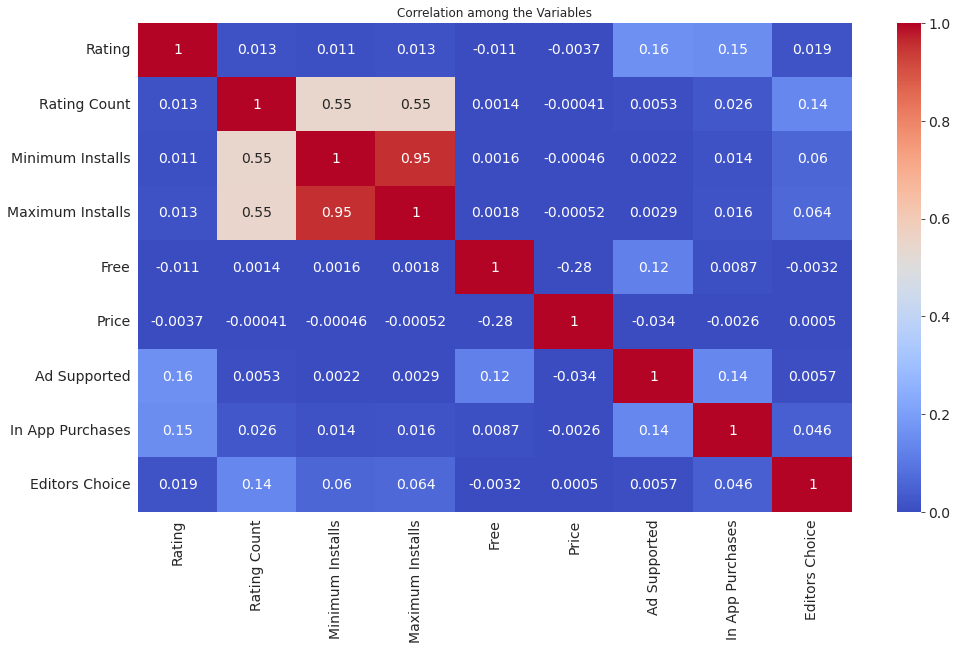

In [74]:
# corr Heatmap
full_df.corr()
fig_corr_heat = sns.heatmap(full_df.corr(),                 
                 cbar= True,
                 cmap='coolwarm',
                 vmin = 0,
                 vmax = 1,
                 annot=True,
                 );

sns.set(rc={'figure.figsize':(20,10)})
plt.axes().set_title('Correlation among the Variables')
fig_corr_heat;

From Above's corelation chart, we can easily conclude that "In-App Purchases" and "Ad support" have impact on Installs and ratings. 

Installs also depands on Rating counts and Editor's choice.  And Money is not kind of matter with any of the other factors. 

# 5 CONCLUSION

## SUMMARY

millions of rows of data and Multiple charts shows someting intresting about the Apps that consumer like to install.

Prople are installing few basic categories Apps often, Education, Gaming, Social etc.

Highly rated Apps seems more downloads. 

In-App purchase and Ad support have close relation with Downloads.

Last couple of years App development seen a boom. Human become more depandent on tech ever then before. 

## Conclusion

In conclusion, the data visualization and analysis project on Google Playstore apps has provided valuable insights into the app market on the platform. Our analysis revealed the most popular categories of apps, the average ratings and size of apps, and the distribution of installs by price. Furthermore, we also explored the relationship between app ratings and installs, and found that higher rated apps tend to have more installs. These findings can be useful for app developers and marketers as they plan their app strategy, as well as for users who want to find high-quality apps. However, it's important to note that the data used in this analysis only represents a snapshot of the app market on Google Playstore, and there may be other factors that affect app success. Nevertheless, data visualization and analysis continue to play a crucial role in understanding and improving the app market.

## FUTURE WORK

*   Work with Live data from DBMS like SQL
*   create Intractive 3D charts
*   create Animated chart
*   add graph Object
*   Also combine [Apple App Store](https://www.kaggle.com/datasets/gauthamp10/apple-appstore-apps?select=appleAppData.csv) Dataset

## RESOURCES

*   [Kaggle DATASET](https://www.kaggle.com/datasets/gauthamp10/google-playstore-apps)
*   [Google](https://www.google.com/)
* [w3school](https://www.google.com/search?q=w3school+pandas&oq=&aqs=chrome.1.69i57j69i59l3j69i60l4.7770j0j4&sourceid=chrome&ie=UTF-8)
* [Jovian](https://jovian.com/learn/zero-to-data-analyst-bootcamp/lesson/advanced-data-analysis-techniques)
* [Pandas](https://pandas.pydata.org/docs/reference/frame.html)
* [Seaborn](https://seaborn.pydata.org/examples/index.html)
* [matplotlib](https://matplotlib.org/stable/plot_types/index)
* [plotly](https://plotly.com/python/)
* [Inspired by](https://www.linkedin.com/pulse/my-first-exploratory-data-analysis-project-dr-ragini-selukar/)


